In [2]:
##!/usr/bin/python -tt 
# -*- coding: utf-8 -*-
from __future__ import unicode_literals
from __future__ import print_function
import keras

from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, AveragePooling2D
from keras import backend as K
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, cohen_kappa_score,accuracy_score
from keras.models import model_from_json
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping
from keras.layers.normalization import BatchNormalization
import itertools
import glob
import errno
import os
import cv2
import numpy as np
import time
from keras.utils.vis_utils import plot_model
from keras.callbacks import CSVLogger
from contextlib import redirect_stdout
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.preprocessing import LabelEncoder
from keras.applications.resnet50 import ResNet50
from sklearn.metrics import classification_report
from __future__ import unicode_literals
from matplotlib import rcParams

###================== load image from filename
def loadClass(path,file):
    with open(path+file,'r',encoding='utf-8') as f:
        lines=f.readlines()

    cl=[[],[]]
    for i,linecode in enumerate(lines):
        line=linecode.rstrip('\r\n')
#        line=linecode.rstrip('\r')
        code=line.split('\t')
        cl[0].append(code[0]) # Ascii code
        cl[1].append(code[1]) # character
#        print(cl[0][i],'\t',cl[1][i])
        if code[0]>='249':
            break
      
    return cl   
#path='D:\\OCR201810\\NEWCNN\\EnThOCR64\\'
#classname=loadClass(path,'list_code_char.txt')

def loadDataset(path,file,cl):
    with open(path+file,'r',encoding='utf-8') as f:
        rlines=f.readlines()
    dataX=[]
    dataY=[]
 #   clCode=cl[0]
 #   clChar=cl[1]
 #   print(clChar)
    for i,lines in enumerate(rlines):
        line=lines.rstrip('\n')
        txt=line.split('\t')
        dataX.append(path+txt[1])
#        dataY.append(txt[0])
        num=cl[0].index(txt[0])
        dataY.append(num)
#        print(dataX[i],dataY[i],cl[1][num])
#        print(txt[0],'\t',labels[i],'\t',txt[1])
    return dataX, dataY
        
#listName, labels=loadDataset(path,'list_all_ts.txt',classname)

In [31]:
class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, listName, labels, batch_size=32, dim=(32,32), n_channels=1,
                 n_classes=10, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.listName = listName
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.cur_batch = 1
        self.n_samples = len(labels)
        self.n_batch=int(np.floor(self.n_samples / self.batch_size))
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return self.n_batch

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]        
            
        # Find list of IDs
        listName_temp = [self.listName[k] for k in indexes]
        labels_temp = [self.labels[k] for k in indexes]
        # Generate data
        X, y = self.__data_generation(listName_temp, labels_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(self.n_samples)

        if self.shuffle == True:
            np.random.shuffle(self.indexes)
#        self.cur_batch=0

    def __data_generation(self, listName_temp, labels_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = []
        y = []
        # Generate data
        for i, fileName in enumerate(listName_temp):
            if self.n_channels==1:
                img = cv2.imread(fileName,0) # read image file , 0=Grayscale
            else:
                img = cv2.imread(fileName,1) # read image file 
            height = img.shape[0]
            width = img.shape[1]
            if not(width==self.dim[1] and height==self.dim[0]):
                img = cv2.resize(img,(self.dim[0],self.dim[1]), interpolation = cv2.INTER_CUBIC)
                height, width = self.dim[0],self.dim[1]
                cv2.imwrite(fileName,img)
            
            # Store sample
            X.append(np.asarray(img.reshape(self.dim[0], self.dim[1], self.n_channels),np.float32)/255.0)
            # Store class
            y.append(labels_temp[i])
        return np.array(X), np.array(y)
    
            
def generateEvaluationGraph(history,i):
    # Loss curves
    f,(ax1,ax2)=plt.subplots(1,2,figsize=(16,6))    
    f.suptitle('Fold: '+str(i),fontsize=18)
    ax1.plot(history.history['loss'],'r',linewidth=3.0)
    ax1.plot(history.history['val_loss'],'b',linewidth=3.0)
    ax1.legend(['Training set', 'Validation set'],fontsize=16)
    ax1.set_xlabel('Epochs ',fontsize=16)
    ax1.set_ylabel('Loss',fontsize=16)
    ax1.set_title('Loss Curves',fontsize=16)
 
    # Accuracy Curves
    ax2.plot(history.history['acc'],'r',linewidth=3.0)
    ax2.plot(history.history['val_acc'],'b',linewidth=3.0)
    ax2.legend(['Training set', 'Validation set'],fontsize=16)
    ax2.set_xlabel('Epochs ',fontsize=16)
    ax2.set_ylabel('Accuracy',fontsize=16)
    ax2.set_title('Accuracy Curves',fontsize=16)
    return f

###================== creat Basic CNN
def buildBasicModel1(model,input_shape):  
    model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2))

    model.add(Conv2D(64, (3, 3), activation='relu') )
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2))

    #model.add(Dropout(0.25))
    # fully connected dense layers
    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.4))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(loss=keras.losses.categorical_crossentropy,optimizer=keras.optimizers.Adam(),
        metrics=['accuracy'])    
    return model

###================== creat Lenet-5 CNN
def buildLenet5Model1(model,input_shape):  
    # C1 Convolutional Layer
    model.add(Conv2D(6, kernel_size=(5, 5),strides=(1, 1), activation='tanh', input_shape=input_shape))
    # S2 Pooling Layer
    model.add(AveragePooling2D(pool_size=(2, 2), strides=(2, 2)))
#    model.add(Dropout(0.2))
    
    # C3 Convolutional Layer
    model.add(Conv2D(16, kernel_size=(5, 5),strides=(1, 1), activation='tanh') )
    # S4 Pooling Layer
    model.add(AveragePooling2D(pool_size=(2, 2),strides=(2,2)))
#    model.add(Dropout(0.2))

    # C5 Fully Connected Convolutional Layer
    model.add(Conv2D(120,  kernel_size=(5, 5), strides=(1, 1), activation='tanh'))
#    model.add(Dropout(0.2))
    #Flatten the CNN output so that we can connect it with fully connected layers
    model.add(Flatten())

    # FC6 Fully Connected Layer
    model.add(Dense(84, activation='tanh'))
    #Output Layer with softmax activation
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(loss=keras.losses.categorical_crossentropy,optimizer=keras.optimizers.SGD(),
        metrics=['accuracy'])    

    return model

###================== creat VGG16 CNN
def buildVGG16Model1(model,input_shape,train=True):  
    # block1 Convolutional Layer
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
    # block2 Convolutional Layer
    model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same',data_format='channels_last'))
    model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same',data_format='channels_last'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
    # block3 Convolutional Layer
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same',data_format='channels_last'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same',data_format='channels_last'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same',data_format='channels_last'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same',data_format='channels_last'))
    # block4 Convolutional Layer
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same',data_format='channels_last'))
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same',data_format='channels_last'))
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same',data_format='channels_last'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same',data_format='channels_last'))
    # block5 Convolutional Layer
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same',data_format='channels_last'))
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same',data_format='channels_last'))
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same',data_format='channels_last'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same',data_format='channels_last'))
    
    #Flatten the CNN output so that we can connect it with fully connected layers
    model.add(Flatten())

    # FC6 Fully Connected Layer
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    #Output Layer with softmax activation
    model.add(Dense(num_classes, activation='softmax'))
    if train:
        model.compile(loss=keras.losses.categorical_crossentropy,optimizer=keras.optimizers.SGD(),
            metrics=['accuracy'])    

    return model

###================== creat VGG16 CNN
def buildResNetModel1(model,input_shape):  
    conv_base=ResNet50(include_top=False,input_shape=input_shape)
    conv_base.trainable = trainable
    for layer in conv_base.layers:
        layer.trainable = trainable
    top_model = Sequential()
    top_model.add(Flatten(input_shape=conv_base.output_shape[1:]))
    top_model.add(Dropout(0.3))
    model.add(Dense(17, activation='sigmoid'))
    model = Model(inputs=main_model.input, outputs=top_model(conv_base.output))

#    opt = optimizers.Adam(lr=learn_rate, decay=decay)

    model.compile(loss=keras.losses.categorical_crossentropy,
                  optimizer=keras.optimizers.SGD(),metrics=['accuracy'])
    
    return model
##================== creat Basic CNN M11 (as keras example)
def buildModelM71(model,input_shape):  
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2,padding='same',data_format='channels_last'))

    model.add(Conv2D(128, (3, 3), activation='relu',padding='same',data_format='channels_last') )
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2,padding='same',data_format='channels_last'))

    model.add(Conv2D(512, (3, 3), activation='relu',padding='same',data_format='channels_last') )
    model.add(Conv2D(512, (3, 3), activation='relu',padding='same',data_format='channels_last') )
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2,padding='same',data_format='channels_last'))

    # fully connected dense layers
    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(loss=keras.losses.categorical_crossentropy,
                  optimizer=keras.optimizers.Adam(),metrics=['accuracy'])
    return model

###================== creat Basic CNN M11 (as keras example)
def buildModelM72(model,input_shape):  
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2,padding='same',data_format='channels_last'))

    model.add(Conv2D(128, (3, 3), activation='relu',padding='same',data_format='channels_last') )
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2,padding='same',data_format='channels_last'))

    model.add(Conv2D(192, (3, 3), activation='relu',padding='same',data_format='channels_last') )
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2,padding='same',data_format='channels_last'))

    model.add(Conv2D(256, (3, 3), activation='relu',padding='same',data_format='channels_last') )
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2,padding='same',data_format='channels_last'))

    # fully connected dense layers
    model.add(Flatten())
    model.add(Dense(1024, activation='relu'))
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(loss=keras.losses.categorical_crossentropy,
                  optimizer=keras.optimizers.Adam(),metrics=['accuracy'])
    return model
###================== creat Basic CNN M11 (as keras example)
def buildMyModel(model,input_shape):  
    model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2,padding='same',data_format='channels_last'))

    model.add(Conv2D(64, (3, 3), activation='relu',padding='same',data_format='channels_last') )
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2,padding='same',data_format='channels_last'))

    model.add(Conv2D(128, (3, 3), activation='relu',padding='same',data_format='channels_last') )
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2,padding='same',data_format='channels_last'))

    model.add(Conv2D(256, (3, 3), activation='relu',padding='same',data_format='channels_last') )
    model.add(MaxPooling2D(pool_size=(2, 2),strides=2,padding='same',data_format='channels_last'))

    # fully connected dense layers
    model.add(Flatten())
    model.add(Dense(1024, activation='relu'))
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(loss=keras.losses.categorical_crossentropy,
                  optimizer=keras.optimizers.Adam(),metrics=['accuracy'])
    return model

###=========================== main
print('load class name...')
path='D:\\OCR201810\\NEWCNN\\EnThOCR32\\'
class_name=loadClass(path,'list_code_char_new.txt')

Xdata_train,Ydata_train=loadDataset(path,'list_all_tr_new.txt',class_name)
Xdata_ts,Ydata_ts=loadDataset(path,'list_all_ts_new.txt',class_name)
Xdata_test, Xdata_valid, Ydata_test, Ydata_valid = train_test_split(Xdata_ts, Ydata_ts, test_size=0.5)
training_samples=len(Xdata_train)
test_samples=len(Xdata_test)
validation_samples=len(Xdata_valid)
print('A number of training samples=',training_samples)
print('A number of test samples=',test_samples)
print('A number of validation samples=',validation_samples)

seed = 7
np.random.seed(seed)
# Generate image and label
print('Generating images and labels...')
# input image dimensions
img_rows, img_cols, channel = 32, 32, 1
num_classes=len(class_name[0])
print('number of classes=',num_classes)
batch_size=256
# Parameters
params = {'dim': (img_rows,img_cols,channel),
          'batch_size': batch_size,
          'n_classes': num_classes,
          'n_channels': channel,
          'shuffle': True}

print('batch_size=',batch_size)
y_train=np.array(Ydata_train)
y_valid=np.array(Ydata_valid)

#print(Ydata_test)
#labels_train=keras.utils.to_categorical(y_train)
labels_train=keras.utils.to_categorical(y_train, num_classes=num_classes)
#labels_valid=keras.utils.to_categorical(y_valid)
#print(labels_valid.shape)
labels_valid=keras.utils.to_categorical(y_valid, num_classes=num_classes)
training_generator = DataGenerator(Xdata_train, labels_train, **params)
validation_generator = DataGenerator(Xdata_valid, labels_valid, **params)
'''training_generator = batch_generator(Xdata_train, Ydata_train, **params)
validation_generator = batch_generator(Xdata_valid, Ydata_valid, **params)'''

print('Finish to generate data...')



load class name...
A number of training samples= 306440
A number of test samples= 122576
A number of validation samples= 122576
Generating images and labels...
number of classes= 163
batch_size= 256
Finish to generate data...


In [40]:

### create model
input_shape = (img_rows, img_cols, channel)
model = Sequential()
#model = buildLenet5Model1(model,input_shape)
model = buildVGG16Model1(model,input_shape)
#model =buildMyModel(model, input_shape)
#model = buildResNetModel1(model,input_shape)

newpath='D:\\OCR201810\\NEWCNN\\ResultEnThOCR32\\'
#stop_here = EarlyStopping(monitor='val_loss',patience=5,verbose=0)
plot_model(model, to_file=newpath+'model_plot.png', show_shapes=True, show_layer_names=True)
with open(newpath+'model_summary.txt', 'w') as f:
    with redirect_stdout(f):
        model.summary()
model.summary()

epochs = 40
### start session
session_config = K.tf.ConfigProto(log_device_placement=False, allow_soft_placement=True)    
# please do not use the totality of the GPU memory
session_config.gpu_options.per_process_gpu_memory_fraction = 0.90
print("training....")
start=time.time()
    # Fit the model
#    csv_logger = CSVLogger(newpath+'history%02d.log'%(i+1),append=True, separator=',') 
csv_logger = CSVLogger(newpath+'history.log',append=False, separator=',') 
steps_per_epoch=training_samples//batch_size
valid_steps=validation_samples//batch_size

history=model.fit_generator(generator=training_generator,steps_per_epoch=steps_per_epoch,epochs=epochs,
                            validation_data=validation_generator,validation_steps=valid_steps,
                            callbacks=[csv_logger], use_multiprocessing=False, workers=0, verbose=1)

done = time.time()
elapsed = done - start
time_str=time.strftime("ETA of each round=%H:%M:%S\n", time.gmtime(elapsed))
print(time_str)
# serialize weights to HDF5
model.save(newpath+'model01.h5')
print("Saved model01 to disk")

    # evaluate the model
#    score = model.evaluate(x_train[valid], y_train[valid], verbose=0)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_62 (Conv2D)           (None, 30, 30, 64)        640       
_________________________________________________________________
conv2d_63 (Conv2D)           (None, 28, 28, 64)        36928     
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_64 (Conv2D)           (None, 14, 14, 128)       73856     
_________________________________________________________________
conv2d_65 (Conv2D)           (None, 14, 14, 128)       147584    
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 7, 7, 128)         0         
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 7, 7, 256)         295168    
__________

Evaluate model...
Prediction model...
478/478 [==============================] - 48s 100ms/step

loss: 22.17%	acc: 93.85%


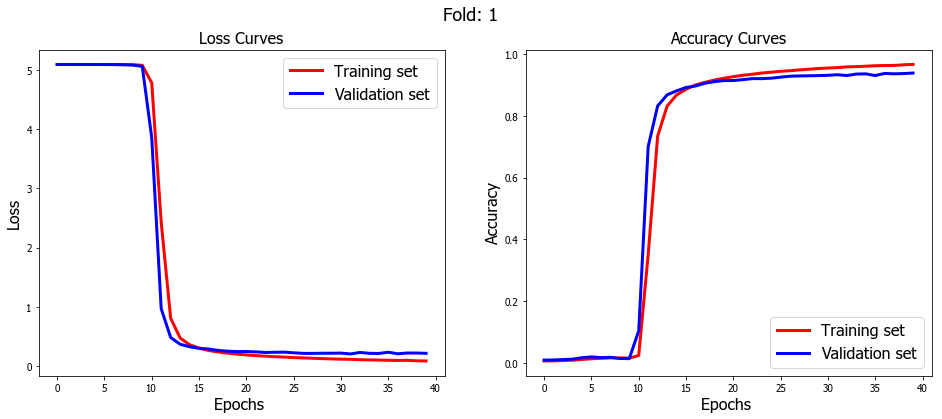

In [41]:
fig=generateEvaluationGraph(history,1)
try:
    with PdfPages(newpath+'plot.pdf') as pdf:
        pdf.savefig(fig)
except ValueError:
    print('error save plot.pdf')

#test_generator = batch_generator(Xdata_test, Ydata_valid, **params)
y_test=np.array(Ydata_test)
labels_test=keras.utils.to_categorical(y_test)
#labels_test=keras.utils.to_categorical(y_test, num_classes=num_classes)
params2 = {'dim': (img_rows,img_cols,channel),
          'batch_size': batch_size, #test_samples
          'n_classes': num_classes,
          'n_channels': channel,
          'shuffle': False}
test_generator = DataGenerator(Xdata_test, labels_test, **params2)
test_steps=test_samples//batch_size
#test_steps=1
print("Evaluate model...")
score = model.evaluate_generator(generator=test_generator, steps=test_steps)
print("Prediction model...")
y_pred = model.predict_generator(generator=test_generator, steps=test_steps, verbose=1)


loss=score[0]*100
ac=score[1]*100
print("\n%s: %.2f%%\t%s: %.2f%%" % (model.metrics_names[0], loss, model.metrics_names[1], ac))


In [42]:
y_true = np.argmax(labels_test,axis=1)
y_pr = np.argmax(y_pred,axis=1)
yt=len(y_true)
yp=len(y_pr)

if yt>yp:
    y_true = y_true[0:yp]
elif yp>yt:
    y_pr = y_pr[0:yt]

acc=accuracy_score(y_true,y_pr)*100
print('acc=',acc)
report=classification_report(y_true, y_pr, target_names=class_name[1],digits=4)
print(report)
with open(newpath+'evaluation.txt','w',encoding='utf-8') as fi:
#    fi.write(time_str+'\n')
    fi.write('ETA of each round=00:54:13\n')
    fi.write('loss=%.4f%%\tacc=%.4f%%\n'%(loss,ac))
    fi.write('prediction\nacc=%.4f%%\n'%acc)
    fi.write('confusion matrix\n')
    fi.write(report)
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_true, y_pr)
print(cnf_matrix.shape)
with open(newpath+'confusion.txt','w',encoding='utf-8') as f:
    f.write('\t'+' '.join(class_name[1][0:num_classes]))
    cnf=cnf_matrix.tolist()
    for i,cn in enumerate(class_name[1]):
        f.write('\n'+cn+'\t')
        cf_line=cnf[i]
        for j in range(num_classes):
            f.write(' '+str(cf_line[j]))
print('finish writing confusion')

acc= 93.8480648535565
             precision    recall  f1-score   support

          #     0.9890    0.9756    0.9823       739
          $     0.9973    0.9894    0.9934       756
          &     0.9959    0.9865    0.9912       741
          '     0.8946    0.8820    0.8883       712
          (     0.9760    0.9910    0.9835       780
          )     0.9683    0.9946    0.9813       738
          *     0.9796    0.9301    0.9542       773
          +     0.9756    0.8097    0.8850       741
          ,     0.9124    0.9077    0.9100       769
          -     0.5604    0.8930    0.6887       748
          .     0.6143    0.8638    0.7180       734
          /     0.7935    0.9922    0.8818       767
          0     0.7289    0.7412    0.7350       711
          1     0.9488    0.8675    0.9063       747
          2     1.0000    0.9960    0.9980       741
          3     0.9959    1.0000    0.9980       735
          4     0.9987    0.9961    0.9974       763
          5     0.9920 

finish writing confusion


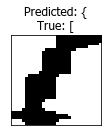

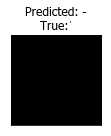

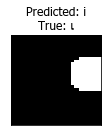

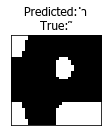

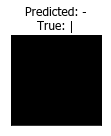

...

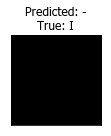

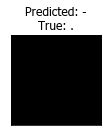

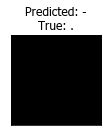

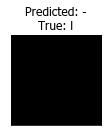

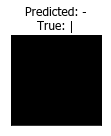

accuracy of test= 0.9384806485355649


In [43]:

rcParams["font.family"]='Tahoma'
ac=0
with PdfPages(newpath+'incorrect.pdf') as pdf:
    for ind in range(test_generator.__len__()):
        x,y = test_generator.__getitem__(ind)
        pred = model.predict(x)
        y_gt = np.argmax(y,axis=1)
        y_pd = np.argmax(pred,axis=1)
        y_zip = zip(y_gt,y_pd)
#    print(class_name[1])
#    print(class_name[1][1])
        text_pd=[]
        text_gt=[]
        for gt,pd in y_zip:
            text_pd.append(class_name[1][pd])
            text_gt.append(class_name[1][gt])
            if gt==pd:
                ac+=1
        for i in range(len(y)):
            if text_pd[i]!= text_gt[i]:
                fig = plt.figure(figsize=(2, 2))
                txt='Predicted: %s\nTrue: %s' % (text_pd[i], text_gt[i])
#                print(txt)
                img = x[i][:, :, 0]
                plt.title(txt, fontsize=12)
                plt.imshow(img, cmap='gray')
                plt.xticks([])
                plt.yticks([])
                fig.tight_layout()
                plt.show()
                pdf.savefig(fig)

ac=ac/len(y_true)
print('accuracy of test=',ac)

In [ ]:
pathmodel='D:/OCR201810/NewCNN/ResultEnThOCR32/all/R32_lenet51_ep50_b512_nodrop/'
model = buildVGG16Model1(model,input_shape,train=False)
model = load_model(newpath+'model.h5')
model.compile(loss=keras.losses.categorical_crossentropy,optimizer=keras.optimizers.SGD(),
            metrics=['accuracy'])    
